# Ensemble Techniques Project

## Author: Abhinav Roy

### Date - 07/11/2022

In [156]:
# import the important packages
import pandas as pd #library used for data manipulation and analysis
import numpy as np # library used for working with arrays.
import matplotlib.pyplot as plt # library for plots and visualisations
import seaborn as sns # library for visualisations
import plotly.express as px # library for visualisations
%matplotlib inline 

import scipy.stats as stats # this library contains a large number of probability distributions as well as a growing library of statistical functions.
from scipy.stats import *
from math import *

import warnings # ignore warnings
warnings.filterwarnings("ignore")

import time

In [157]:
#!pip install catboost
#!pip install lightgbm
#!pip install xgboost

In [158]:
# import machine learning algorithms
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics
#from sklearn.metrics import classification_report, confusion_matrix , accuracy_score
from sklearn.metrics import *
from sklearn import model_selection
#from sklearn.model_selection import cross_val_score, cross_validate, GridSearchCV
from sklearn.model_selection import *
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBClassifier
from xgboost import XGBRegressor

from collections import Counter

## Part A

DOMAIN: Telecom

· CONTEXT: A telecom company wants to use their historical customer data to predict behaviour to retain customers. You can analyse all

relevant customer data and develop focused customer retention programs.

· DATA DESCRIPTION: Each row represents a customer, each column contains customer’s attributes described on the column Metadata. The

data set includes information about:

•	Customers who left within the last month – the column is called Churn

•	Services that each customer has signed up for – phone, multiple lines, internet, online security, online backup, device protection, tech support, and

streaming TV and movies

•	Customer account information – how long they’ve been a customer, contract, payment method, paperless billing, monthly charges, and total charges •	Demographic info about customers – gender, age range, and if they have partners and dependents


· PROJECT OBJECTIVE: To Build a model that will help to identify the potential customers who have a higher probability to churn. This helps the

company to understand the pinpoints and patterns of customer churn and will increase the focus on strategizing customer retention.


· STEPS AND TASK [30 Marks]:

1.	Data Understanding & Exploration: [5 Marks]

A.	Read ‘TelcomCustomer-Churn_1.csv’ as a DataFrame and assign it to a variable. [1 Mark]

B.	Read ‘TelcomCustomer-Churn_2.csv’ as a DataFrame and assign it to a variable. [1 Mark]

C.	Merge both the DataFrames on key ‘customerID’ to form a single DataFrame [2 Mark]

D.	Verify if all the columns are incorporated in the merged DataFrame by using simple comparison Operator in Python. [1 Marks]


2.	Data Cleaning & Analysis: [5 Marks]

A.	Impute missing/unexpected values in the DataFrame. [2 Marks]

B.	Make sure all the variables with continuous values are of ‘Float’ type. [2 Marks]

[For Example: MonthlyCharges, TotalCharges]

C.	Create a function that will accept a DataFrame as input and return pie-charts for all the appropriate Categorical features. Clearly show percentage

distribution in the pie-chart. [4 Marks]

D.	Share insights for Q2.c. [2 Marks]

E.	Encode all the appropriate Categorical features with the best suitable approach. [2 Marks]

F.	Split the data into 80% train and 20% test. [1 Marks]

G.	Normalize/Standardize the data with the best suitable approach. [2 Marks]


3.	Model building and Improvement: [10 Marks]

A.	Train a model using XGBoost. Also print best performing parameters along with train and test performance. [5 Marks]

B.	Improve performance of the XGBoost as much as possible. Also print best performing parameters along with train and test performance. [5 Marks]


## 1. Data Understanding & Exploration

In [159]:
# Read ‘TelcomCustomer-Churn_1.csv’ as a DataFrame and assign it to a variable
df1 = pd.read_csv("TelcomCustomer-Churn_1.csv")
df1.sample(5)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity
5004,2067-QYTCF,Female,0,Yes,No,64,Yes,Yes,Fiber optic,No
2039,6298-QDFNH,Male,0,No,No,22,Yes,Yes,Fiber optic,No
2360,7064-JHXCE,Male,0,Yes,Yes,62,Yes,No,No,No internet service
6353,8735-DCXNF,Male,0,Yes,No,10,Yes,No,DSL,Yes
4472,9541-ZPSEA,Male,0,Yes,Yes,68,Yes,No,Fiber optic,Yes


In [160]:
# dataframe df1 shape
df1.shape

(7043, 10)

In [161]:
# dataframe df1 information
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   customerID       7043 non-null   object
 1   gender           7043 non-null   object
 2   SeniorCitizen    7043 non-null   int64 
 3   Partner          7043 non-null   object
 4   Dependents       7043 non-null   object
 5   tenure           7043 non-null   int64 
 6   PhoneService     7043 non-null   object
 7   MultipleLines    7043 non-null   object
 8   InternetService  7043 non-null   object
 9   OnlineSecurity   7043 non-null   object
dtypes: int64(2), object(8)
memory usage: 550.4+ KB


In [162]:
# Read ‘TelcomCustomer-Churn_2.csv’ as a DataFrame and assign it to a variable
df2 = pd.read_csv("TelcomCustomer-Churn_2.csv")
df2.sample(5)

,customerID,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
4481,8644-XYTSV,No,No,No,Yes,No,Month-to-month,Yes,Bank transfer (automatic),40.15,1626.05,No
1557,4672-FOTSD,Yes,No,Yes,No,No,Month-to-month,Yes,Electronic check,67.25,832.3,No
5303,9839-ETQOE,Yes,Yes,No,No,No,Month-to-month,Yes,Electronic check,40.45,1912.85,No
5472,4277-UDIEF,No,No,Yes,Yes,Yes,Month-to-month,No,Bank transfer (automatic),81.00,1923.85,No
679,2826-UWHIS,Yes,No,No,No,No,Month-to-month,No,Bank transfer (automatic),81.40,3775.85,No


In [163]:
# dataframe df2 shape
df2.shape

(7043, 12)

In [164]:
# dataframe df2 information
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   OnlineBackup      7043 non-null   object 
 2   DeviceProtection  7043 non-null   object 
 3   TechSupport       7043 non-null   object 
 4   StreamingTV       7043 non-null   object 
 5   StreamingMovies   7043 non-null   object 
 6   Contract          7043 non-null   object 
 7   PaperlessBilling  7043 non-null   object 
 8   PaymentMethod     7043 non-null   object 
 9   MonthlyCharges    7043 non-null   float64
 10  TotalCharges      7043 non-null   object 
 11  Churn             7043 non-null   object 
dtypes: float64(1), object(11)
memory usage: 660.4+ KB


In [165]:
# Merge both the DataFrames on key ‘customerID’ to form a single DataFrame 
df = pd.merge(df1, df2, on = 'customerID', how = 'outer')
df.sample(5)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
6666,0822-QGCXA,Female,1,Yes,No,27,Yes,Yes,DSL,No,...,Yes,Yes,Yes,Yes,Month-to-month,No,Electronic check,83.85,2310.2,No
4361,8680-CGLTP,Male,0,No,No,29,Yes,No,DSL,Yes,...,No,Yes,No,No,One year,Yes,Electronic check,58.75,1696.2,No
6803,5681-LLOEI,Male,0,Yes,Yes,43,Yes,Yes,Fiber optic,Yes,...,Yes,Yes,No,No,One year,Yes,Credit card (automatic),91.25,4013.8,No
4858,3950-VPYJB,Male,0,Yes,Yes,57,Yes,No,DSL,Yes,...,No,Yes,No,No,One year,No,Mailed check,59.60,3509.4,No
1348,1184-PJVDB,Male,0,Yes,No,10,Yes,No,Fiber optic,No,...,No,No,Yes,No,Month-to-month,Yes,Electronic check,79.95,857.2,Yes


In [166]:
# dataframe df shape
df.shape

(7043, 21)

In [167]:
# dataframe df information
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [168]:
# Verify if all the columns are incorporated in the merged DataFrame by using simple comparison Operator in Python. 
df[df.isna().any(axis = 1)]
len(df.columns) == len(df1.columns) + len(df2.columns[1:])

True

## 2. Data Cleaning & Analysis

In [169]:
# Impute missing/unexpected values in the DataFrame
df.isna().sum().to_frame()

,0
customerID,0
gender,0
SeniorCitizen,0
Partner,0
Dependents,0
tenure,0
PhoneService,0
MultipleLines,0
InternetService,0
OnlineSecurity,0


In [170]:
# Drop feature customerID since it is Unique and not useful for training any machine learning algorithm
df.drop('customerID', axis = 1, inplace = True)
df.head(5)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [171]:
# Make sure all the variables with continuous values are of ‘Float’ type
#df['TotalCharges'] = df['TotalCharges'].astype('float') 

#### Observations:

1) Feature MonthlyCharges is already of data type float.

2) For feature feature TotalCharges, the above error indicates that some of the rows contain non strings, such as blank spaces.

In [172]:
# Check for rows with blank spaces in feature TotalCharges
df[df['TotalCharges'].str.contains(' ') == True]

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,No
753,Male,0,No,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,Yes,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1340,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,Yes,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,No
3331,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,No
3826,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,No
4380,Female,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,No
5218,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,No
6670,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,No


In [173]:
# Remove the null rows for TotalCharges
df = df[~df['TotalCharges'].str.contains(' ') == True]

In [174]:
# Make sure all the variables with continuous values are of ‘Float’ type
df['TotalCharges'] = df['TotalCharges'].astype('float')

In [175]:
# Covert SeniorCitizen feature to object data type, since it is a categorical feature
df['SeniorCitizen'] = df['SeniorCitizen'].astype('object')

In [176]:
# Covert tenure feature to float data type, since it is a numerical feature
df['tenure'] = df['tenure'].astype('float')

In [177]:
# dataframe df information
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7032 non-null   object 
 1   SeniorCitizen     7032 non-null   object 
 2   Partner           7032 non-null   object 
 3   Dependents        7032 non-null   object 
 4   tenure            7032 non-null   float64
 5   PhoneService      7032 non-null   object 
 6   MultipleLines     7032 non-null   object 
 7   InternetService   7032 non-null   object 
 8   OnlineSecurity    7032 non-null   object 
 9   OnlineBackup      7032 non-null   object 
 10  DeviceProtection  7032 non-null   object 
 11  TechSupport       7032 non-null   object 
 12  StreamingTV       7032 non-null   object 
 13  StreamingMovies   7032 non-null   object 
 14  Contract          7032 non-null   object 
 15  PaperlessBilling  7032 non-null   object 
 16  PaymentMethod     7032 non-null   object 


In [178]:
# Changing datatypes of categorical features
str_cols = df.select_dtypes(include = 'object').columns.to_list()
for i in str_cols:
    df[i] = df[i].astype('category')

In [179]:
# dataframe df information
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   gender            7032 non-null   category
 1   SeniorCitizen     7032 non-null   category
 2   Partner           7032 non-null   category
 3   Dependents        7032 non-null   category
 4   tenure            7032 non-null   float64 
 5   PhoneService      7032 non-null   category
 6   MultipleLines     7032 non-null   category
 7   InternetService   7032 non-null   category
 8   OnlineSecurity    7032 non-null   category
 9   OnlineBackup      7032 non-null   category
 10  DeviceProtection  7032 non-null   category
 11  TechSupport       7032 non-null   category
 12  StreamingTV       7032 non-null   category
 13  StreamingMovies   7032 non-null   category
 14  Contract          7032 non-null   category
 15  PaperlessBilling  7032 non-null   category
 16  PaymentMethod     7032 n

In [180]:
# Function that will accept a DataFrame as input and return pie-charts for all the appropriate Categorical features
def cat_var_pie(df_pie, col_cnt, fig_size_x = 15, fig_size_y = 15):
    
    ncols = col_cnt
    cat_cols = df_pie.select_dtypes(include = 'category').columns.to_list()
    r = len(cat_cols)
    nrows = r // ncols + (r % ncols > 0)
    index = 1
    plt.figure(figsize = (fig_size_x, fig_size_y))
    
    for col in cat_cols:
        plt.subplot(nrows, ncols, index)
        plt.title(" Pie chart for Feature: {}".format(col), ha = 'center')
        df[col].value_counts().plot.pie(autopct = '%1.1f%%', shadow = True)
        index += 1;

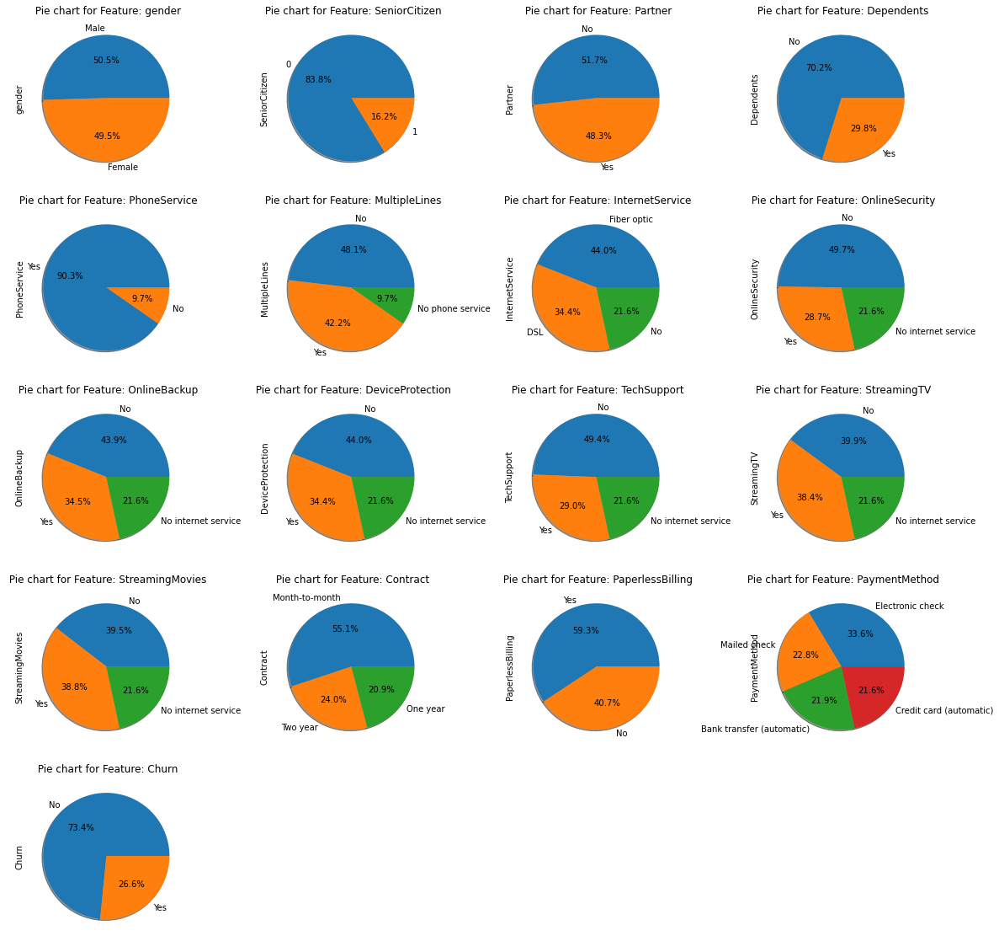

In [181]:
# Calling the function to plot pie-charts for all categorical variables
cat_var_pie(df, 4, 20, 20)

#### Observations:

1) Genders, seems we have equal number of both males and females customers.

2) We have mostly young customers compared to senior.

3) Customers with or without partners are about the same.

4) We have more customers without dependent members.

5) Majority of the customers who have a phone service.

6) Customers who have internet service, prefer mostly Fiber optic followed by DSL.

7) There is a common pattern in the features MultipleLines, InternetService, OnlineSecurity, OnlineBackup, TechSupport. It is illustated that most of the customers prefer not to have access to these features than those who have.

8) The features, StreamingMovies and StreamingTV have similar compositions, which means there are equal amount of customers who prefer have these services.

9) In general customers prefer month-to-month contracts compared to two year or one year contracts.

10) Most customers would rather have Paperless billing than any other form.

11) The customers use all the different forms of payment methods available, but with Electronic Checks being used the most.

In [182]:
# Function that will accept a DataFrame as input and return Histogram & Boxplot for all the appropriate Numerical features
def num_var_distn(df_pie, fig_size_x = 15, fig_size_y = 3):
    
    num_cols = df.select_dtypes(exclude = 'category').columns.to_list()

    for i in num_cols:
        fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (fig_size_x, fig_size_y))
        plt.suptitle("Histogram & Boxplot for {} feature".format(i), ha = 'center')
        sns.histplot(data = df, x = i, ax = ax[0], fill = True, kde = True, color = 'Green')
        sns.boxplot(data = df, x = i, ax = ax[1], color = 'Orange')
        #checking count of outliers
        q25, q75 = np.percentile(df[i], 25), np.percentile(df[i], 75)
        IQR = q75 - q25
        Threshold = IQR * 1.5
        lower, upper = q25 - Threshold, q75 + Threshold
        Outliers = [i for i in df[i] if i < lower or i > upper]
        print('{} Total Number of outliers in {}: {}'.format('\033[1m',i,len(Outliers)))

 Total Number of outliers in tenure: 0
 Total Number of outliers in MonthlyCharges: 0
 Total Number of outliers in TotalCharges: 0


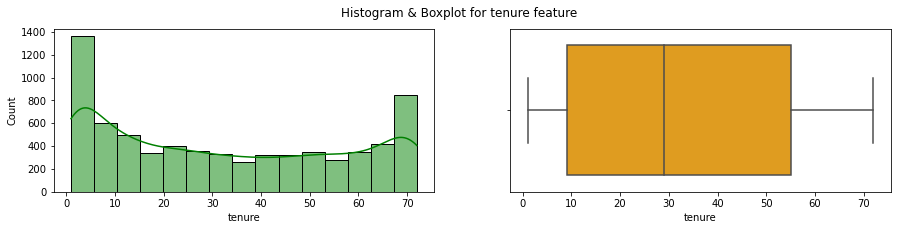

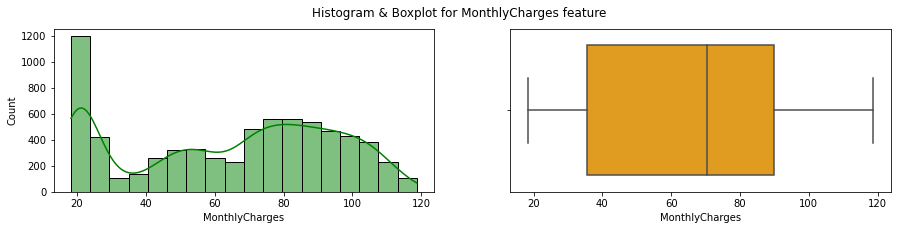

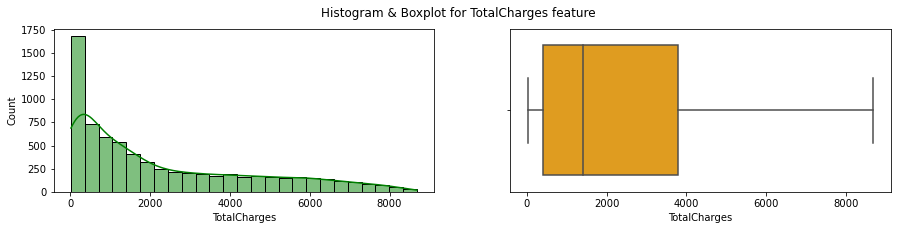

In [183]:
# Calling the function to plot Histogram & Boxplot for all Numerical features
num_var_distn(df)

#### Observations:

Since, the distribution of the Numerical features does not follow a normal distribution, we will use Normalization instead of Standardization for Feature Scaling.

In [184]:
# splitting the datasaet into categorical and numerical columns
cat_cols = df.select_dtypes(include = 'category').columns.to_list()
num_cols = df.select_dtypes(exclude = 'category').columns.to_list()

In [185]:
#Encode all the appropriate Categorical features with the best suitable approach
#Encoding Categorical features
df[cat_cols] = df[cat_cols].apply(LabelEncoder().fit_transform)

In [186]:
# Normalize/Standardize the data with the best suitable approach. 
# define min max scaler for Numerical features
scaler = MinMaxScaler(feature_range = (0, 1))
# transform data
df[num_cols] = scaler.fit_transform(df[num_cols])

In [187]:
# dataframe sample
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,0.000000,0,1,0,0,2,0,0,0,0,0,1,2,0.115423,0.001275,0
1,1,0,0,0,0.464789,1,0,0,2,0,2,0,0,0,1,0,3,0.385075,0.215867,0
2,1,0,0,0,0.014085,1,0,0,2,2,0,0,0,0,0,1,3,0.354229,0.010310,1
3,1,0,0,0,0.619718,0,1,0,2,0,2,2,0,0,1,0,0,0.239303,0.210241,0
4,0,0,0,0,0.014085,1,0,1,0,0,0,0,0,0,0,1,2,0.521891,0.015330,1


## 3. Model building and Improvement

#### Train a model using XGBoost. Also print best performing parameters along with train and test performance. 

In [188]:
# Arrange data into independent variables and dependent variables
X = df.drop(labels = 'Churn' , axis = 1)
y = df['Churn']

In [189]:
X.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,0,0,1,0,0.000000,0,1,0,0,2,0,0,0,0,0,1,2,0.115423,0.001275
1,1,0,0,0,0.464789,1,0,0,2,0,2,0,0,0,1,0,3,0.385075,0.215867
2,1,0,0,0,0.014085,1,0,0,2,2,0,0,0,0,0,1,3,0.354229,0.010310
3,1,0,0,0,0.619718,0,1,0,2,0,2,2,0,0,1,0,0,0.239303,0.210241
4,0,0,0,0,0.014085,1,0,1,0,0,0,0,0,0,0,1,2,0.521891,0.015330


In [190]:
y.head().to_frame()

,Churn
0,0
1,0
2,1
3,0
4,1


In [191]:
y.value_counts().to_frame()

,Churn
0,5163
1,1869


#### Observations:

We can see that the target/ predictor feature(Churn) contains imbalanced data.

But, there is no need to resample the data if the model is suited for imbalanced data. XGBoost is already a good starting point if the classes are not skewed too much, because it internally takes care that the bags it trains on are not imbalanced. But then again, the data is resampled, it is just happening within the model.

In [192]:
# Split the data into 80% train and 20% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 1)

#### Since, the Target feature(Churn) is a Categorical variable, we will use XGBClassifier instead of XGBRegressor to train the model.

#### Model Building

In [211]:
# Build and fit XGBoost Classification model
xgb_clas = XGBClassifier()
xgb_clas.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [212]:
# Make predictions on Train and Test data
y_train_pred = xgb_clas.predict(X_train)
y_test_pred = xgb_clas.predict(X_test)

In [195]:
# Classification Accuracy
print(accuracy_score(y_train_pred, y_train))
print(accuracy_score(y_test_pred, y_test))

0.9354666666666667
0.7789623312011372


In [214]:
# Print the model performance metrics
print('Model Performance Metrics - XGBoost Classification')
print('-------------------------------------------------------')
print('Train performance')
print('-------------------------------------------------------')
print(classification_report(y_train, y_train_pred))

print('Test performance')
print('-------------------------------------------------------')
print(classification_report(y_test, y_test_pred))

print('Roc_auc score')
print('-------------------------------------------------------')
print(roc_auc_score(y_test, y_test_pred))
print('')

Model Performance Metrics - XGBoost Classification
-------------------------------------------------------
Train performance
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.97      0.96      4122
           1       0.91      0.84      0.87      1503

    accuracy                           0.94      5625
   macro avg       0.93      0.91      0.92      5625
weighted avg       0.93      0.94      0.93      5625

Test performance
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.83      0.88      0.86      1041
           1       0.59      0.48      0.53       366

    accuracy                           0.78      1407
   macro avg       0.71      0.68      0.69      1407
weighted avg       0.77      0.78      0.77      1407

Roc_auc score
-------------------------------------------------------
0.6832057762869875



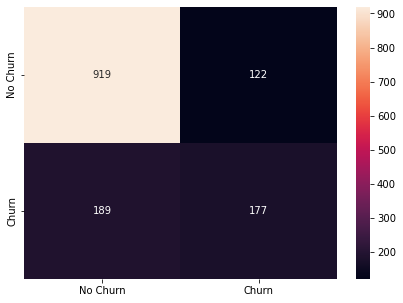

In [197]:
# Confusion Matrix 
cm = confusion_matrix(y_test, y_test_pred, labels = [0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No Churn","Churn"]],
                  columns = [i for i in ["No Churn","Churn"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot = True , fmt = 'g')
plt.show()

#### Observations:

1) The model accuracy on train data(94%) and test data(78%) represents overfiting of the training data. 

We need to reduce the overfit of train data by hyper-tuning the model to improve the performance of test data w.r.t the test data.

#### Improve performance of the XGBoost as much as possible. Also print best performing parameters along with train and test performance. 

In [198]:
# define the parameters for the model
params = {"n_estimators":[67,70,100,120], 'reg_lambda':[2,1], 'gamma':[0,0.3,0.2,0.1]
       , 'eta':[0.06,0.05,0.04]
        , 'max_depth':[3,5], 'objective':['binary:logistic']}

In [199]:
# Build and fit XGBoost Classification model with GridSearchCV
clf = GridSearchCV(xgb_clas, params, cv = 10, n_jobs = -1, verbose = 1, scoring='accuracy')
clf.fit(X_train, y_train)

Fitting 10 folds for each of 192 candidates, totalling 1920 fits


GridSearchCV(cv=10,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     callbacks=None, colsample_bylevel=1,
                                     colsample_bynode=1, colsample_bytree=1,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=0, gpu_id=-1,
                                     grow_policy='depthwise',
                                     importance_type=None,
                                     interaction_constraints='',
                                     learning_rate=0.30000001...
                                     max_leaves=0, min_child_weight=1,
                                     missing=nan, monotone_constraints='()',
                                     n_estimators=100, n_jobs=0,
                                     num_parallel_tree=1, predictor='auto',
                                     random_state=0, ...),
             n_jobs=-1,
             param_grid={'eta': [0.06, 0.05, 0.04], 'gamma': [0, 0.3, 0.2, 0.1],
                         'max_depth': [3, 5],
                         'n_estimators': [67, 70, 100, 120],
                         'objective': ['binary:logistic'],
                         'reg_lambda': [2, 1]},
             scoring='accuracy', verbose=1)

In [ ]:
# Make predictions on Train and Test data
ypred = clf.predict(X_train)
tpred = clf.predict(X_test)

In [201]:
# Classification Accuracy
print(accuracy_score(ypred, y_train))
print(accuracy_score(tpred, y_test))
clf.best_params_

0.8348444444444444
0.8031272210376688


{'eta': 0.06,
 'gamma': 0.2,
 'max_depth': 3,
 'n_estimators': 67,
 'objective': 'binary:logistic',
 'reg_lambda': 2}

In [213]:
# Print the model performance metrics
print('Model Performance Metrics - XGBoost Classification with GridSearchCV')
print('-------------------------------------------------------')
print('Train performance')
print('-------------------------------------------------------')
print(classification_report(y_train, ypred))

print('Test performance')
print('-------------------------------------------------------')
print(classification_report(y_test, tpred))

print('Roc_auc score')
print('-------------------------------------------------------')
print(roc_auc_score(y_test, tpred))
print('')

model performance metrics for XGBoost Classification model with GridSearchCV
-------------------------------------------------------
Train performance
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.92      0.89      4122
           1       0.74      0.59      0.66      1503

    accuracy                           0.83      5625
   macro avg       0.80      0.76      0.77      5625
weighted avg       0.83      0.83      0.83      5625

Test performance
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      1041
           1       0.66      0.51      0.58       366

    accuracy                           0.80      1407
   macro avg       0.75      0.71      0.72      1407
weighted avg       0.79      0.80      0.79      1407

Roc_auc score
----------------------------------------------------

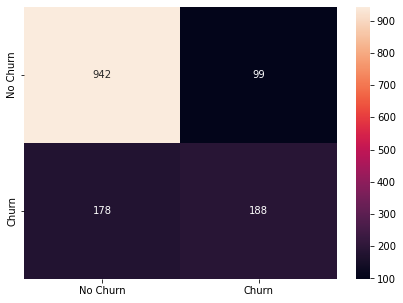

In [203]:
# Confusion Matrix 
cm = confusion_matrix(y_test, tpred, labels = [0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No Churn","Churn"]],
                  columns = [i for i in ["No Churn","Churn"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot = True , fmt = 'g')
plt.show()

#### Observations:

1) We can clearly see that the model accuracy increases on both train data(83%) and test data(80%) after tuning the model with GridSearchCV on top of the base XGBClassifier model.

2) We can see that the model F1 score also increases.

3) From the confusion matrix, we can see an improvement in the classification of Churn and Non-Churn customers.

#### Building a XGBRegressor model to test and experiment the performance of the model

#### Model Building

In [204]:
# Build XGBoost Regression Model
xgb_reg = XGBRegressor()
xgb_reg.fit(X_train, y_train, verbose = False)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [205]:
# make predictions
predictions = xgb_reg.predict(X_test)
# print model performance
print("r2 Score : " + str(r2_score(predictions, y_test)))
print("Mean Absolute Error : " + str(mean_absolute_error(predictions, y_test)))
print("Mean Squared Error : " + str(mean_squared_error(predictions, y_test)))

r2 Score : -0.8794670880294586
Mean Absolute Error : 0.2804922976058911
Mean Squared Error : 0.1570012660921435


### Model Tuning

XGBoost has a few parameters that can dramatically affect your model's accuracy and training speed. The first parameters you should understand are:

n_estimators and early_stopping_rounds
n_estimators specifies how many times to go through the modeling cycle.

In the underfitting vs overfitting graph, n_estimators moves you further to the right. Too low a value causes underfitting, which is inaccurate predictions on both training data and new data. Too large a value causes overfitting, which is accurate predictions on training data, but inaccurate predictions on new data (which is what we care about). You can experiment with your dataset to find the ideal. Typical values range from 100-1000, though this depends a lot on the learning rate discussed below.

The argument early_stopping_rounds offers a way to automatically find the ideal value. Early stopping causes the model to stop iterating when the validation score stops improving, even if we aren't at the hard stop for n_estimators. It's smart to set a high value for n_estimators and then use early_stopping_rounds to find the optimal time to stop iterating.

Since random chance sometimes causes a single round where validation scores don't improve, you need to specify a number for how many rounds of straight deterioration to allow before stopping. early_stopping_rounds = 5 is a reasonable value. Thus we stop after 5 straight rounds of deteriorating validation scores.

In [206]:
# Build XGBoost Regression Model
xgb_reg_1 = XGBRegressor(n_estimators = 1000)
xgb_reg_1.fit(X_train, y_train, early_stopping_rounds = 3, 
             eval_set = [(X_test, y_test)], verbose = False)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [207]:
# make predictions
predictions = xgb_reg_1.predict(X_test)
# print model performance
print("r2 Score : " + str(r2_score(predictions, y_test)))
print("Mean Absolute Error : " + str(mean_absolute_error(predictions, y_test)))
print("Mean Squared Error : " + str(mean_squared_error(predictions, y_test)))

r2 Score : -1.195201482798915
Mean Absolute Error : 0.27389334010618244
Mean Squared Error : 0.1377789562420704


learning_rate

Instead of getting predictions by simply adding up the predictions from each component model, we will multiply the predictions from each model by a small number before adding them in. This means each tree we add to the ensemble helps us less. In practice, this reduces the model's propensity to overfit.

So, you can use a higher value of n_estimators without overfitting. If you use early stopping, the appropriate number of trees will be set automatically.

In general, a small learning rate (and large number of estimators) will yield more accurate XGBoost models, though it will also take the model longer to train since it does more iterations through the cycle.

In [208]:
# Build XGBoost Regression Model
xgb_reg_2 = XGBRegressor(n_estimators = 1000, learning_rate = 0.01)
xgb_reg_2.fit(X_train, y_train, early_stopping_rounds = 3, 
             eval_set = [(X_test, y_test)], verbose = False)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.01, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [209]:
# make predictions
predictions = xgb_reg_2.predict(X_test)
# print model performance
print("r2 Score : " + str(r2_score(predictions, y_test)))
print("Mean Absolute Error : " + str(mean_absolute_error(predictions, y_test)))
print("Mean Squared Error : " + str(mean_squared_error(predictions, y_test)))

r2 Score : -1.4985810989306856
Mean Absolute Error : 0.28320500833877943
Mean Squared Error : 0.1369981036683449


#### Observations:

For XGBRegressor, we can see that the Mean Absolute Error, Mean Squared Error improve marginally, but thr r2 score increases to show that the test model fit is not ideal even after model tuning.

## End of Part A

## Part B

DOMAIN: IT

· CONTEXT: The purpose is to build a machine learning workflow that will work autonomously irrespective of Data and users can save efforts

involved in building workflows for each dataset.

· PROJECT OBJECTIVE: Build a machine learning workflow that will run autonomously with the csv file and return best performing model.

· STEPS AND TASK [30 Marks]:

1.	Build a simple ML workflow which will accept a single ‘.csv’ file as input and return a trained base model that can be used for predictions. You can use

1 Dataset from Part 1 (single/merged).

2.	Create separate functions for various purposes.

3.	Various base models should be trained to select the best performing model.

4.	Pickle file should be saved for the best performing model.

Include best coding practices in the code:

•	Modularization

•	Maintainability

•	Well commented code etc.


Please Note:

Here, if you need to perform some research to build a workflow. If you could, very well done! If not, please follow below instructions:

1.	Create separate function fo every step individually.

For Example: Separate function to remove null values, separate function for normalization etc.

On top of it, if you could build some rule based logic, you’ll gain better experience.

2.	Once you are done with building smaller functions, you can group similar functions into another function to proceed with.

For Example: create a function ‘preprocessing_’ and call all the preprocessing related functions within that function.

3.	Once done with this, Stack all the functions sequentially within ‘main’ function to conclude.

4.	Here, knowledge and skills required are of Supervised Learning and Python module only.

5.	By building function modules in workflows, you will start gaining industry best practices as you go further in the AIML program else only marks are gained with

traditional approach of programming.

6.	If this project is solved by traditional approach, evaluation will be done out of 20 Marks. And if industry approach is followed successfully, bonus of 10 marks

will awarded and evaluation will be done out of 30 Marks.


In [294]:
#!pip install auto-sklearn

In [295]:
#!pip install git+https://github.com/automl/auto-sklearn

In [296]:
#!pip install pipelineprofiler

In [320]:
# Function to import the important packages and machine learning algorithms
def import_libs():
  # import the important packages and machine learning algorithms
  import matplotlib.pyplot as plt
  import seaborn as sns
  import numpy as np
  import PipelineProfiler
  import autosklearn.classification
  from autosklearn.classification import AutoSklearnClassifier
  import pandas as pd
  import numpy as np
  import matplotlib.pyplot as plt
  import seaborn as sns
  from sklearn.model_selection import train_test_split
  from sklearn.metrics import accuracy_score
  import warnings # ignore warnings
  warnings.filterwarnings("ignore")
  '''
  print('\n')
  print('-------------------------------------------------------')
  print('The important packages and machine learning algorithms have been imported')
  print('-------------------------------------------------------')
  print('\n')  
  '''

In [315]:
# Calling the function to import the important packages and machine learning algorithms
import_libs()



-------------------------------------------------------
The important packages and machine learning algorithms have been imported
-------------------------------------------------------




In [319]:
# Function to import the dataset
def import_dataset(df_path):
  import_libs()
  from google.colab import drive
  drive.mount('/content/drive')

  global df, df5
  '''
  print('\n')
  print('-------------------------------------------------------')
  print('Dataframe sample after importing')
  print('-------------------------------------------------------')
  print('\n') 
  '''

  df = pd.read_csv(df_path)
  df5 = df.copy(deep = True)
  return df.head()

In [300]:
# Calling the function to import the dataset
import_dataset("/content/drive/MyDrive/GreatLearning/00/GL_Projects/03_Ensemble_Techniques/Churn.csv")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


-------------------------------------------------------
Dataframe sample after importing
-------------------------------------------------------




,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [321]:
# Function to display dataset information and description
def dataset_info():
    '''
    print('\n')
    print('-------------------------------------------------------')
    print('Dataframe Information and Description')
    print('-------------------------------------------------------')
    print('\n')
    '''
    global df1
    df1 = df.copy(deep = True)
    # dataframe features information
    print(df1.info())
    
    # dataframe numerical features description 
    print(df1.describe())
       
    # Verify if all the columns are incorporated in the merged DataFrame by using simple comparison Operator in Python. 
    print(df1.isna().sum().to_frame())

In [302]:
# Calling the function to display dataset information and description
dataset_info()



-------------------------------------------------------
Dataframe Information and Description
-------------------------------------------------------


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7032 non-null   object 
 1   SeniorCitizen     7032 non-null   int64  
 2   Partner           7032 non-null   object 
 3   Dependents        7032 non-null   object 
 4   tenure            7032 non-null   int64  
 5   PhoneService      7032 non-null   object 
 6   MultipleLines     7032 non-null   object 
 7   InternetService   7032 non-null   object 
 8   OnlineSecurity    7032 non-null   object 
 9   OnlineBackup      7032 non-null   object 
 10  DeviceProtection  7032 non-null   object 
 11  TechSupport       7032 non-null   object 
 12  StreamingTV       7032 non-null   object 
 13  StreamingMovies   7032 non-nu

In [322]:
# Function to pre-process the dataset for EDA
def data_pre_process():
    '''
    print('\n')
    print('-------------------------------------------------------')
    print('Dataframe after pre-processing')
    print('-------------------------------------------------------')
    print('\n')
    '''
    global df2
    df2 = df1.copy(deep = True)
    # Remove the null rows for TotalCharges
    df2 = df2[~df2['TotalCharges'].apply(str).str.contains(' ') == True]
    
    # Make sure all the variables with continuous values are of ‘Float’ type
    df2['TotalCharges'] = df2['TotalCharges'].astype('float')
    
    # Covert SeniorCitizen feature to object data type, since it is a categorical feature
    df2['SeniorCitizen'] = df2['SeniorCitizen'].astype('object')
    
    # Covert tenure feature to float data type, since it is a numerical feature
    df2['tenure'] = df2['tenure'].astype('float')
    
    # Changing datatypes of categorical features
    str_cols = df2.select_dtypes(include = 'object').columns.to_list()
    for i in str_cols:
        df2[i] = df2[i].astype('category')
    
    # splitting the datasaet into categorical and numerical columns
    cat_cols = df.select_dtypes(include = 'category').columns.to_list()
    num_cols = df.select_dtypes(exclude = 'category').columns.to_list()
    
    # dataframe sample
    return df2.head()

In [304]:
# Calling the function to pre-process the dataset for EDA
data_pre_process()



-------------------------------------------------------
Dataframe after pre-processing
-------------------------------------------------------




,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1.0,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34.0,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,0,No,No,2.0,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45.0,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2.0,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [323]:
# Function that will accept a DataFrame as input and return pie-charts for all the appropriate Categorical features
def cat_var_pie(col_cnt, fig_size_x = 15, fig_size_y = 15):
    import_libs()
    '''
    print('\n')
    print('-------------------------------------------------------')
    print('Pie-charts for all the appropriate Categorical features')
    print('-------------------------------------------------------')
    print('\n')    
    '''    
    global df3
    df3 = df2.copy(deep = True)
    ncols = col_cnt
    cat_cols = df3.select_dtypes(include = 'category').columns.to_list()
    r = len(cat_cols)
    nrows = r // ncols + (r % ncols > 0)
    index = 1
    plt.figure(figsize = (fig_size_x, fig_size_y))
    
    for col in cat_cols:
        plt.subplot(nrows, ncols, index)
        plt.title(" Pie chart for Feature: {}".format(col), ha = 'center')
        df3[col].value_counts().plot.pie(autopct = '%1.1f%%', shadow = True)
        index += 1;



-------------------------------------------------------
Pie-charts for all the appropriate Categorical features
-------------------------------------------------------




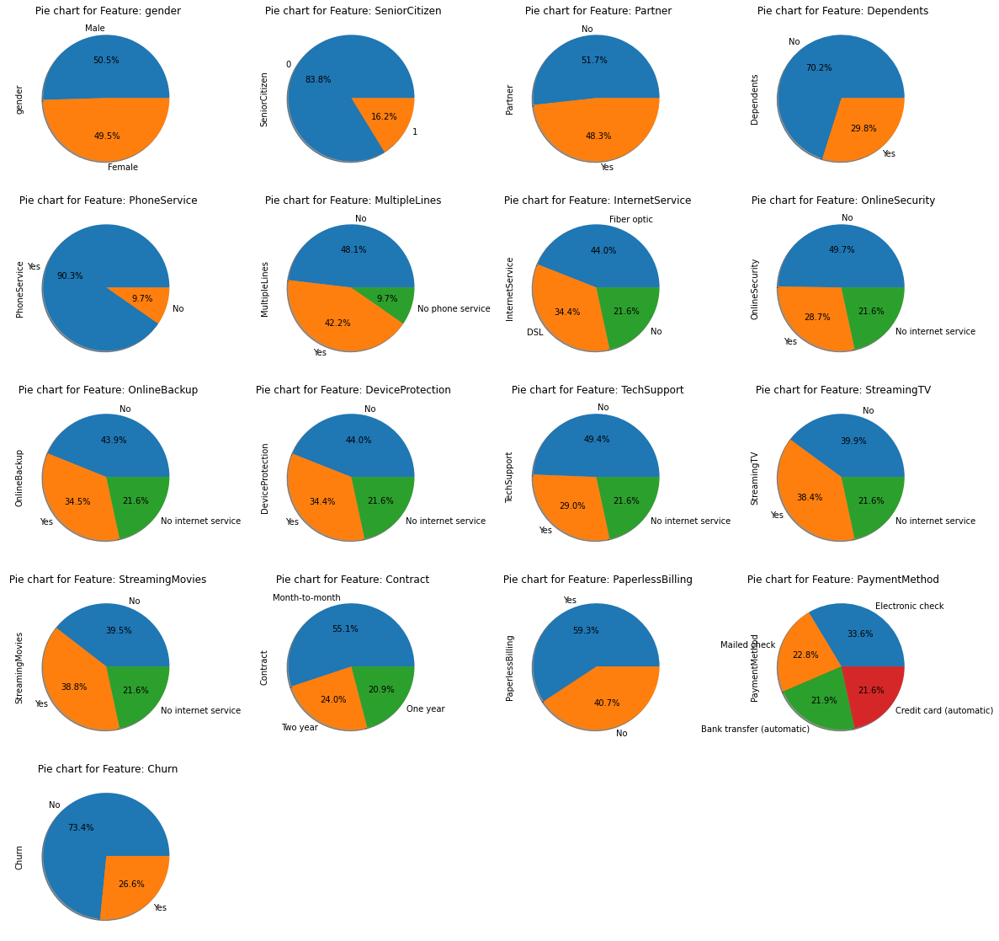

In [306]:
# Calling the function to plot pie-charts for all categorical variables
cat_var_pie(4, 20, 20)

In [324]:
# Function that will accept a DataFrame as input and return Histogram & Boxplot for all the appropriate Numerical features
def num_var_distn(fig_size_x = 15, fig_size_y = 3):
    import_libs()
    '''
    print('\n')
    print('-------------------------------------------------------')
    print('Histogram & Boxplot for all the appropriate Numerical features')
    print('-------------------------------------------------------')
    print('\n')
    '''
    global df4
    df4 = df2.copy(deep = True)
    
    num_cols = df4.select_dtypes(exclude = 'category').columns.to_list()

    for i in num_cols:
        fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (fig_size_x, fig_size_y))
        plt.suptitle("Histogram & Boxplot for {} feature".format(i), ha = 'center')
        sns.histplot(data = df4, x = i, ax = ax[0], fill = True, kde = True, color = 'Green')
        sns.boxplot(data = df4, x = i, ax = ax[1], color = 'Orange')
        #checking count of outliers
        q25, q75 = np.percentile(df4[i], 25), np.percentile(df4[i], 75)
        IQR = q75 - q25
        Threshold = IQR * 1.5
        lower, upper = q25 - Threshold, q75 + Threshold
        Outliers = [i for i in df4[i] if i < lower or i > upper]
        print('{} Total Number of outliers in {}: {}'.format('\033[1m',i,len(Outliers)))



-------------------------------------------------------
Histogram & Boxplot for all the appropriate Numerical features
-------------------------------------------------------


 Total Number of outliers in tenure: 0
 Total Number of outliers in MonthlyCharges: 0
 Total Number of outliers in TotalCharges: 0


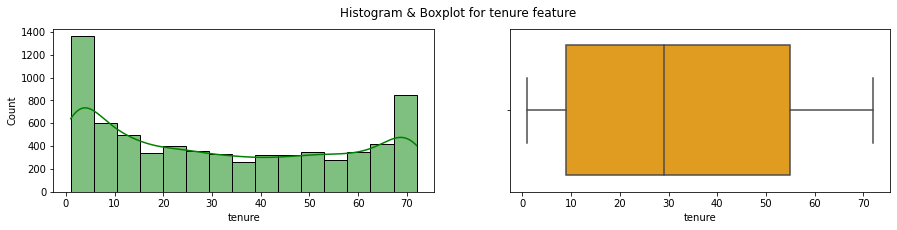

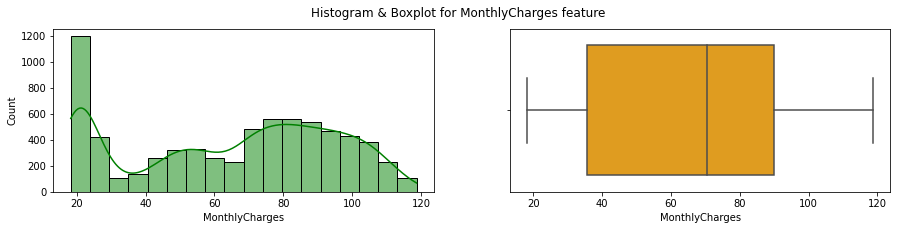

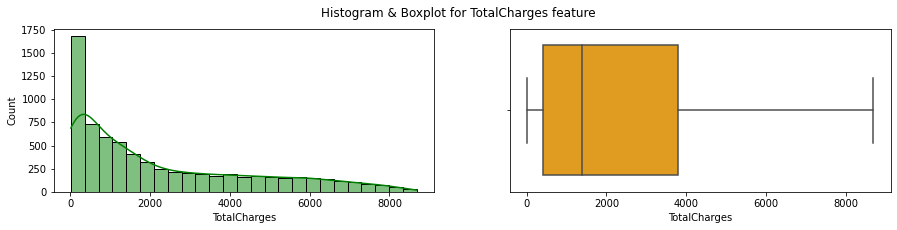

In [308]:
# Calling the function to plot Histogram & Boxplot for all Numerical features
num_var_distn()

## We have used auto-sklearn to fit automate the process of fitting the best model to the dataset.

## But, since AutoSklearn is built for unix systems only, we have built the notebook on Google-colab which provides the support to install auto-sklearn.

## Some of the features are not visible when viewing the notebook on Jupyter, hence attached the snippets for the same.

In [309]:
# Function to bulid and fit the models on the dataset
def model_build():
    import_libs()
    # Arrange data into independent variables and dependent variables
    #global df5
    global X, y

    #df5 = df.copy(deep = True)
    X = df5.drop(labels = 'Churn' , axis = 1)
    y = df5['Churn']

    # Split the data into 80% train and 20% test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 1)

    # Build and fit Auto SKkLearn Classification model
    model = AutoSklearnClassifier(time_left_for_this_task = 1*60)
    model.fit(X_train, y_train)

    # Make predictions on Train and Test data
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Print the model performance metrics
    print('Model Performance Metrics')
    training_accuracy = accuracy_score(y_train_pred, y_train)
    print("Training Accuracy score {0}".format(training_accuracy))
    print('\n')
    print('-------------------------------------------------------')
    testing_accuracy = accuracy_score(y_test_pred, y_test)
    print("Test Accuracy score {0}".format(testing_accuracy))
    print('\n')
    print('-------------------------------------------------------')

    # Print all the model statistics
    print(model.sprint_statistics())
    print('\n')
    print('-------------------------------------------------------')

    profiler_data = PipelineProfiler.import_autosklearn(model)
    PipelineProfiler.plot_pipeline_matrix(profiler_data)

In [310]:
# Calling the function to bulid and fit the models on the dataset
model_build()

[WARNING] [2022-11-13 15:38:42,982:Client-EnsembleBuilder] No runs were available to build an ensemble from
[WARNING] [2022-11-13 15:38:50,153:Client-EnsembleBuilder] No runs were available to build an ensemble from
[WARNING] [2022-11-13 15:38:57,311:Client-EnsembleBuilder] No runs were available to build an ensemble from
[WARNING] [2022-11-13 15:39:04,448:Client-EnsembleBuilder] No runs were available to build an ensemble from
[WARNING] [2022-11-13 15:39:11,598:Client-EnsembleBuilder] No runs were available to build an ensemble from
[WARNING] [2022-11-13 15:39:18,757:Client-EnsembleBuilder] No runs were available to build an ensemble from
[WARNING] [2022-11-13 15:39:20,906:Client-EnsembleBuilder] No runs were available to build an ensemble from
Model Performance Metrics
Training Accuracy score 0.7328


-------------------------------------------------------
Test Accuracy score 0.7398720682302772


-------------------------------------------------------
auto-sklearn results:
  Dataset 

In [311]:
# Main function to call other functions within it
def main_function(dataset_path):
  return [import_libs(), import_dataset(dataset_path), dataset_info(), data_pre_process(), cat_var_pie(4), num_var_distn(), model_build()]

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7032 non-null   object 
 1   SeniorCitizen     7032 non-null   int64  
 2   Partner           7032 non-null   object 
 3   Dependents        7032 non-null   object 
 4   tenure            7032 non-null   int64  
 5   PhoneService      7032 non-null   object 
 6   MultipleLines     7032 non-null   object 
 7   InternetService   7032 non-null   object 
 8   OnlineSecurity    7032 non-null   object 
 9   OnlineBackup      7032 non-null   object 
 10  DeviceProtection  7032 non-null   object 
 11  TechSupport       7032 non-null   object 
 12  StreamingTV       7032 non-null   object 
 13  StreamingMovies   7032 non-null   object 
 14  Contrac

[None,    gender  SeniorCitizen Partner Dependents  tenure PhoneService  \
 0  Female              0     Yes         No       1           No   
 1    Male              0      No         No      34          Yes   
 2    Male              0      No         No       2          Yes   
 3    Male              0      No         No      45           No   
 4  Female              0      No         No       2          Yes   
 
       MultipleLines InternetService OnlineSecurity OnlineBackup  \
 0  No phone service             DSL             No          Yes   
 1                No             DSL            Yes           No   
 2                No             DSL            Yes          Yes   
 3  No phone service             DSL            Yes           No   
 4                No     Fiber optic             No           No   
 
   DeviceProtection TechSupport StreamingTV StreamingMovies        Contract  \
 0               No          No          No              No  Month-to-month   
 1        

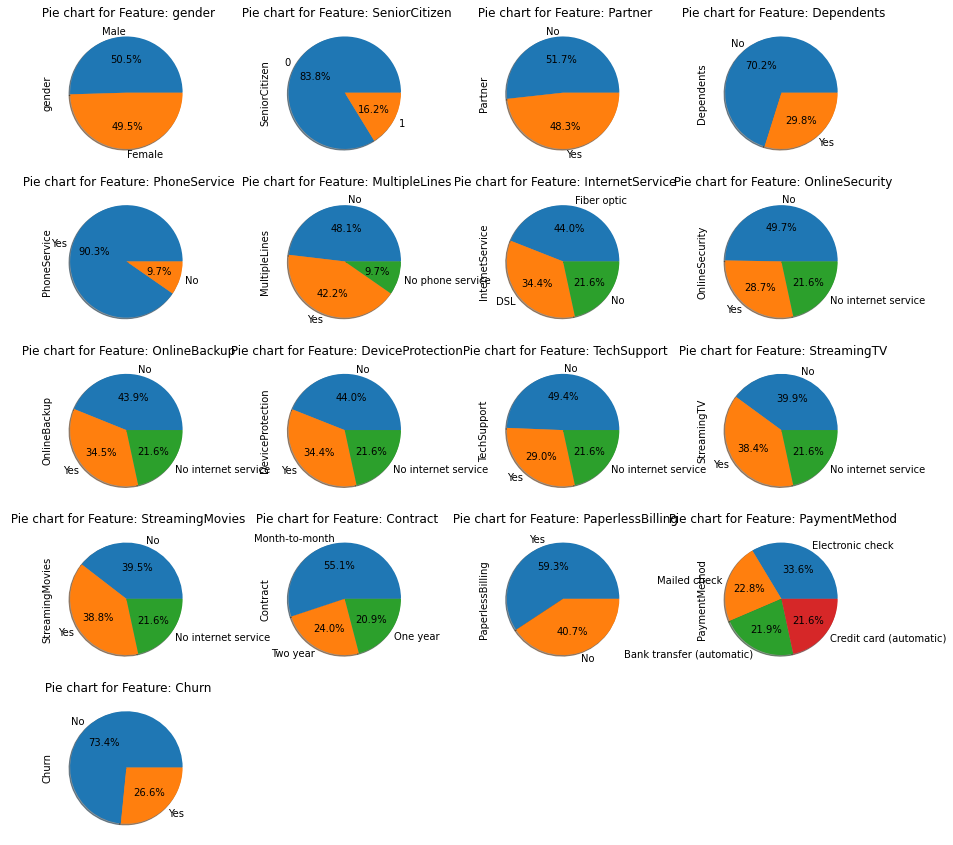

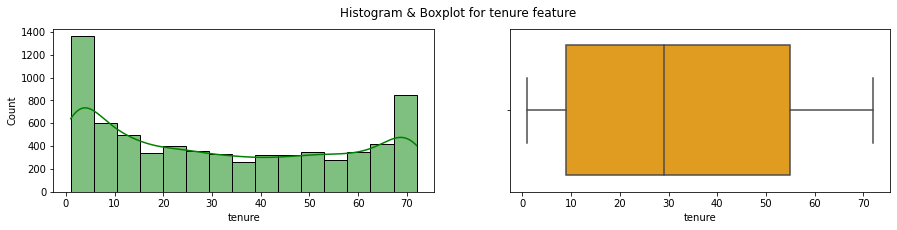

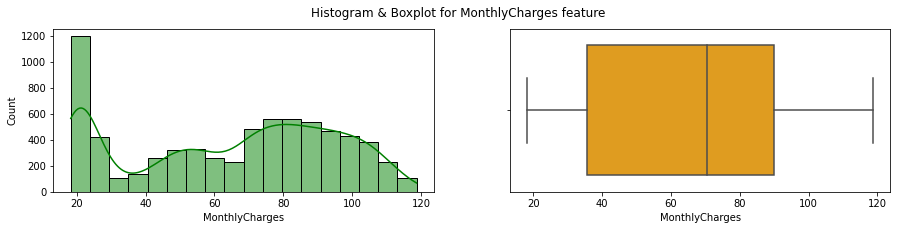

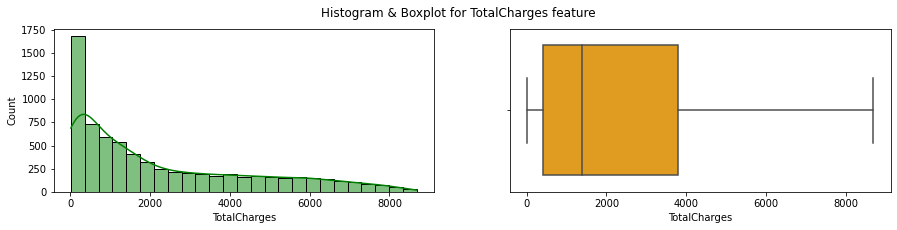

In [325]:
# Calling the Main function
main_function("/content/drive/MyDrive/GreatLearning/00/GL_Projects/03_Ensemble_Techniques/Churn.csv")

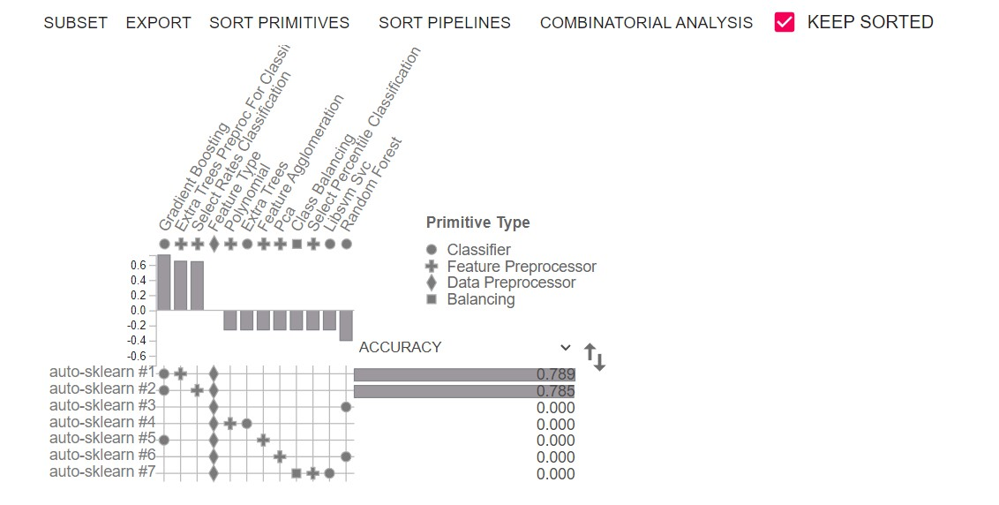

#### Observations:

Auto-sklearn automatically searches for the right learning algorithms for the dataset and optimizes its hyperparameters. 

1) We can see that auto-sklearn trained 7 combinations of Ensemble models with the highest model accuracy of 78.9%(ensemble model 1) followed by 78.5%(ensemble model 2).

## While calling the main function, the output from multiple datasets is getting mixed up. The text data stays on top, but the visualiztions are moved to the end. Please, suggest ways to correct this. Thank you.

## End of Part B

## End of Project